In [1]:
import librosa
from librosa.util import find_files
from librosa import load
import os, re 
import numpy as np
from keras import Input
from keras.optimizers import Adam
import tensorflow as tf
from keras.models import load_model

2024-12-08 20:26:36.000980: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-08 20:26:36.001136: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-08 20:26:36.131046: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
## initializng necessary parameters

SR =  44100
window_size = 1024
hop_length = 512

patch_size = 128

## for training
EPOCH = 100
BATCH = 16
SAMPLING_STRIDE = 6

# **ALL THE FUNCTION NECESSARY**

**Saving Spectrogram**

In [3]:
## SAVE THE SPECTROGRAM

def SaveSpectrogram(y_mix, y_inst, filename, orig_sr=44100) :
    y_mix = librosa.core.resample(y_mix,orig_sr=orig_sr,target_sr=SR)
    y_inst = librosa.core.resample(y_inst,orig_sr=orig_sr,target_sr=SR)
    
    S_mix = librosa.stft(y_mix,n_fft=window_size, hop_length=hop_length)
    S_mix = librosa.amplitude_to_db(np.abs(S_mix))
    
    S_inst = librosa.stft(y_inst, n_fft=window_size, hop_length=hop_length)
    S_inst = librosa.amplitude_to_db(np.abs(S_inst))

#     S_mix = np.abs(librosa.stft(y_mix,n_fft=window_size,hop_length=hop_length)).astype(np.float32)
#     S_inst = np.abs(librosa.stft(y_inst,n_fft=window_size,hop_length=hop_length)).astype(np.float32)
    
#     norm = S_mix.max()
#     S_mix /= norm
#     S_inst /= norm
    
#     print(S_mix.shape,S_inst.shape)
    
    np.savez(os.path.join(filename+'.npz'),mix=S_mix, target=S_inst)
#     return S_mix, S_inst

# mix_audio = mus_train[1].audio.T[0]
# mix_wav_mag, mix_wav_phase = magphase(np.abs(librosa.power_to_db(np.abs(stft(mix_wav, n_fft=window_size, hop_length=hop_length))**2)).astype(np.float32))
# drums_audio = mus_train[1].targets['drums'].audio.T[0]
# x_list, y_list = SaveSpectrogram(mix_audio, drums_audio, "s1")
# print(len(x_list))
# print(len(y_list))
# print(x_list[0])
# print(y_list[0])
# print(mix_wav_mag)

In [4]:
c = 0
os.mkdir('npz')
for song in range(1,41,1):
    mix_audio,_ =librosa.load(f'/kaggle/input/to-delete-renamed/mixtur/{song}.wav',sr=44100 ) 
    bansuri_audio,_ =librosa.load(f'/kaggle/input/to-delete-renamed/Bansuri/{song}.wav',sr=44100 ) 
    SaveSpectrogram(mix_audio, bansuri_audio, f"/kaggle/working/npz/S{c:03d}")
    c = c+1
#     print(c)

In [5]:
def LoadAudio(file_path) :
    y, sr = load(file_path,sr=SR)
    stft = librosa.stft(y,n_fft=window_size,hop_length=hop_length)
    mag, phase = librosa.magphase(stft)
    return mag.astype(np.float32), phase

In [6]:
# Save Audiofile 
def SaveAudio(file_path, mag, phase) :
    y = librosa.istft(mag*phase,win_length=window_size,hop_length=hop_length)
    librosa.output.write_wav(file_path,y,SR,norm=True)
    print("Save complete!!")

In [7]:
## to laod spectrogram

def LoadSpectrogram(file_path) :
    filelist = find_files(file_path, ext="npz")
    x_list = []
    y_list = []
    for file in filelist :
        data = np.load(file)
        x_list.append(data['mix'])
        y_list.append(data['target'])
    print(len(x_list), len(y_list))
    return x_list, y_list

In [8]:
### load the magnitude of audio file 

def Magnitude_phase(spectrogram) :
    Magnitude_list = []
    Phase_list = []
    for X in spectrogram :
        mag, phase = librosa.magphase(X)
        Magnitude_list.append(mag)
        Phase_list.append(phase)
    return Magnitude_list, Phase_list

In [9]:
def sampling(X_mag,Y_mag) :
    X = []
    y = []
    for mix, target in zip(X_mag,Y_mag) :
        starts = np.random.randint(0, mix.shape[1] - patch_size, (mix.shape[1] - patch_size) // SAMPLING_STRIDE)
        for start in starts:
            end = start + patch_size
            X.append(mix[1:, start:end, np.newaxis])
            y.append(target[1:, start:end, np.newaxis])
    return np.asarray(X, dtype=np.float32), np.asarray(y, dtype=np.float32)

# **DEFINING MODEL ARCH**

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 512, 128, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 64, 16)          416       ['input_2[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 256, 64, 16)          64        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 leaky_re_lu (LeakyReLU)     (None, 256, 64, 16)          0         ['batch_normalization[0][0

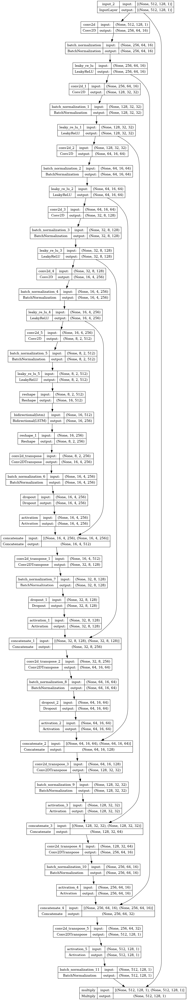

In [10]:
from keras import Input, Model
from keras.layers import Conv2D, Dropout, BatchNormalization, LeakyReLU, Conv2DTranspose, Activation, Concatenate, Multiply, Reshape
from tensorflow.keras.utils import plot_model

def unet(inputs=Input((512, 128, 1))):
    conv1 = Conv2D(16, 5, strides=2, padding='same')(inputs)
    conv1 = BatchNormalization(axis=-1)(conv1)
    conv1 = LeakyReLU(alpha=0.2)(conv1)

    conv2 = Conv2D(32, 5, strides=2, padding='same')(conv1)
    conv2 = BatchNormalization(axis=-1)(conv2)
    conv2 = LeakyReLU(alpha=0.2)(conv2)

    conv3 = Conv2D(64, 5, strides=2, padding='same')(conv2)
    conv3 = BatchNormalization(axis=-1)(conv3)
    conv3 = LeakyReLU(alpha=0.2)(conv3)

    conv4 = Conv2D(128, 5, strides=2, padding='same')(conv3)
    conv4 = BatchNormalization(axis=-1)(conv4)
    conv4 = LeakyReLU(alpha=0.2)(conv4)

    conv5 = Conv2D(256, 5, strides=2, padding='same')(conv4)
    conv5 = BatchNormalization(axis=-1)(conv5)
    conv5 = LeakyReLU(alpha=0.2)(conv5)

    conv6 = Conv2D(512, 5, strides=2, padding='same')(conv5)
    conv6 = BatchNormalization(axis=-1)(conv6)
    conv6 = LeakyReLU(alpha=0.2)(conv6)
    bilstm = Reshape((16,512))(conv6)
    bilstm = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences=True))(bilstm)
    bilstm = Reshape((8,2,256))(bilstm)
    deconv7 = Conv2DTranspose(256, 5, strides=2, padding='same')(bilstm)
    deconv7 = BatchNormalization(axis=-1)(deconv7)
    deconv7 = Dropout(0.5)(deconv7)
    deconv7 = Activation('relu')(deconv7)

    deconv8 = Concatenate(axis=-1)([deconv7, conv5])
    deconv8 = Conv2DTranspose(128, 5, strides=2, padding='same')(deconv8)
    deconv8 = BatchNormalization(axis=-1)(deconv8)
    deconv8 = Dropout(0.5)(deconv8)
    deconv8 = Activation('relu')(deconv8)

    deconv9 = Concatenate(axis=-1)([deconv8, conv4])
    deconv9 = Conv2DTranspose(64, 5, strides=2, padding='same')(deconv9)
    deconv9 = BatchNormalization(axis=-1)(deconv9)
    deconv9 = Dropout(0.5)(deconv9)
    deconv9 = Activation('relu')(deconv9)

    deconv10 = Concatenate(axis=-1)([deconv9, conv3])
    deconv10 = Conv2DTranspose(32, 5, strides=2, padding='same')(deconv10)
    deconv10 = BatchNormalization(axis=-1)(deconv10)
    deconv10 = Activation('relu')(deconv10)

    deconv11 = Concatenate(axis=-1)([deconv10, conv2])
    deconv11 = Conv2DTranspose(16, 5, strides=2, padding='same')(deconv11)
    deconv11 = BatchNormalization(axis=-1)(deconv11)
    deconv11 = Activation('relu')(deconv11)

    deconv12 = Concatenate(axis=-1)([deconv11, conv1])
    deconv12 = Conv2DTranspose(1, 5, strides=2, padding='same')(deconv12)
    deconv12 = Activation('relu')(deconv12)
    deconv12 = BatchNormalization(axis=-1)(deconv12)

    output = Multiply()([deconv12, inputs])
    return Model(inputs=inputs, outputs=output)





# import tensorflow as tf
# from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate, Reshape, Bidirectional, LSTM

# def conv_block(input_tensor, num_filters):
#     encoder = Conv2D(num_filters, (3, 3), padding='same', activation='relu')(input_tensor)
#     encoder = Conv2D(num_filters, (3, 3), padding='same', activation='relu')(encoder)
#     return encoder

# def encoder_block(input_tensor, num_filters):
#     encoder = conv_block(input_tensor, num_filters)
#     encoder_pool = MaxPooling2D((2, 2), strides=(2, 2))(encoder)
#     return encoder_pool, encoder

# def decoder_block(input_tensor, concat_tensor, num_filters):
#     decoder = Conv2D(num_filters, (2, 2), padding='same', activation='relu')(UpSampling2D((2, 2))(input_tensor))
#     decoder = Concatenate(axis=-1)([concat_tensor, decoder])
#     decoder = conv_block(decoder, num_filters)
#     return decoder

# def UNetBiLSTM(input_shape):
#     inputs = Input(shape=input_shape)

#     encoder0_pool, encoder0 = encoder_block(inputs, 16)
#     encoder1_pool, encoder1 = encoder_block(encoder0_pool, 32)
#     encoder2_pool, encoder2 = encoder_block(encoder1_pool, 64)
#     encoder3_pool, encoder3 = encoder_block(encoder2_pool, 128)
#     encoder4_pool, encoder4 = encoder_block(encoder2_pool, 256)

#     center = Conv2D(256, (3, 3), padding='same', activation='relu')(encoder4_pool)
#     lstm_input_shape = center.shape[1:3]

#     lstm_reshape = Reshape(target_shape=(lstm_input_shape[0]*lstm_input_shape[1], 256))(center)
#     lstm = Bidirectional(LSTM(256, return_sequences=True))(lstm_reshape)
#     lstm_reshape_back = Reshape(target_shape=(lstm_input_shape[0], lstm_input_shape[1], 512))(lstm)

#     decoder3 = decoder_block(lstm_reshape_back, encoder3, 256)
#     decoder3 = decoder_block(lstm_reshape_back, encoder3, 128)
#     decoder2 = decoder_block(decoder3, encoder2, 64)
#     decoder1 = decoder_block(decoder2, encoder1, 32)
#     decoder0 = decoder_block(decoder1, encoder0, 16)

#     outputs = Conv2D(1, (1, 1), activation='relu')(decoder0)

#     model = tf.keras.Model(inputs=[inputs], outputs=[outputs])

#     return model

# # Example usage:
# input_shape = (512, 128, 1)  # Example input shape
# num_classes = 1  # Example number of classes (for binary segmentation)

# model = UNetBiLSTM(input_shape)
# model.summary()



inputs = Input((512, 128, 1))
model = unet(inputs)
model.summary()
plot_model(model, to_file='/kaggle/working/model_plot.png', show_shapes=True, show_layer_names=True)

In [11]:
SPECTROGRAM_PATH = '/kaggle/working/npz/'

In [12]:
X_list, Y_list = LoadSpectrogram(SPECTROGRAM_PATH)# Mix spectrogram

40 40


In [13]:
MODEL_PATH = "bansuri.h5"

In [14]:
if os.path.isfile(MODEL_PATH) is True:
    #load the model
    model = load_model(MODEL_PATH)
    print('model loaded successfully')  
else:
    model = unet(inputs)
    model.compile(optimizer=Adam(5e-5), loss='mean_absolute_error')
    print('model created successfully')

model created successfully


In [15]:
# Random sampling for training
X,y = sampling(X_list,Y_list)
print(X.shape)

(15553, 512, 128, 1)


In [16]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn import metrics

In [17]:
model_file="/kaggle/working/best_model.keras"
bm = ModelCheckpoint(model_file, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
es = EarlyStopping(monitor='val_loss', patience=25, mode='min')
callbacks_list = [bm, es]
history=model.fit(X, y, batch_size=BATCH, epochs=1000, validation_split=0.2, callbacks=callbacks_list)
model.save(MODEL_PATH, overwrite=True)
print('model saved successfully')

Epoch 1/1000


2024-12-08 20:27:30.746379: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_1/dropout_3/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1733689653.655177      74 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


778/778 [==============================] - ETA: 0s - loss: 31.4461
Epoch 1: val_loss improved from inf to 21.09131, saving model to /kaggle/working/best_model.keras
778/778 [==============================] - 64s 67ms/step - loss: 31.4461 - val_loss: 21.0913
Epoch 2/1000
777/778 [============================>.] - ETA: 0s - loss: 26.5983
Epoch 2: val_loss did not improve from 21.09131
778/778 [==============================] - 46s 59ms/step - loss: 26.5972 - val_loss: 23.2528
Epoch 3/1000
777/778 [============================>.] - ETA: 0s - loss: 24.3776
Epoch 3: val_loss did not improve from 21.09131
778/778 [==============================] - 47s 60ms/step - loss: 24.3765 - val_loss: 21.4100
Epoch 4/1000
777/778 [============================>.] - ETA: 0s - loss: 22.4605
Epoch 4: val_loss improved from 21.09131 to 19.30878, saving model to /kaggle/working/best_model.keras
778/778 [==============================] - 47s 61ms/step - loss: 22.4619 - val_loss: 19.3088
Epoch 5/1000
777/778 [==

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


model saved successfully


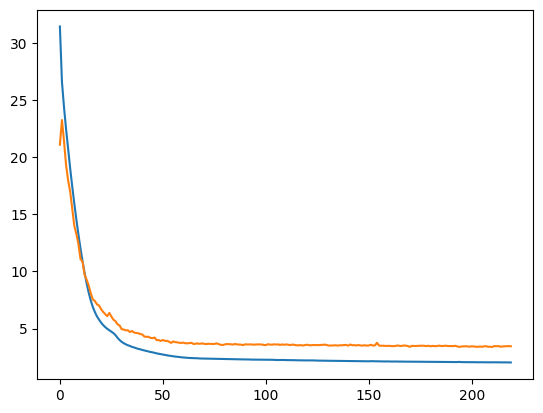

In [18]:
from matplotlib import pyplot as plt
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

# **Testing the output**

In [19]:
import numpy as np
from librosa.core import istft, load, stft, magphase
import soundfile as sf
from keras.models import load_model

In [20]:
def display_spectogram(y,title):
    D = librosa.stft(y)
    S = librosa.amplitude_to_db(D, ref=np.max)
    librosa.display.specshow(S, sr=44100, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'{title}')

In [21]:
model.load_weights('/kaggle/working/best_model.keras')

In [22]:
AUDIO_PATH = '/kaggle/input/to-delete-renamed/mixtur/21.wav'

In [23]:
# mix_wav = mus_train[1].audio.T[0]
# np.abs(stft(mix_wav, n_fft=window_size, hop_length=hop_length)).astype(np.float32)[0],magphase(np.abs(librosa.power_to_db(np.abs(stft(mix_wav, n_fft=window_size, hop_length=hop_length))**2)).astype(np.float32))[0]

In [24]:
mix_wav, _ = load(AUDIO_PATH, sr=44100)
y_mix = librosa.core.resample(mix_wav,orig_sr=44100,target_sr=44100)
S_mix = librosa.stft(y_mix,n_fft=window_size, hop_length=hop_length)
S_mix = librosa.amplitude_to_db(np.abs(S_mix))
number_of_chunks = S_mix.shape[1]//128
target = np.zeros([512,S_mix.shape[1]])
for i in range(number_of_chunks):
    START = i*128
    END = START + 128

    S_mix_new=S_mix[:, START:END]

    X=S_mix_new[1:].reshape(1, 512, 128, 1)

    y=model.predict(X, batch_size=32)
    target[:,START:END] = y.reshape(512,128)
S_mix_new=S_mix[:, -128:]
X=S_mix_new[1:].reshape(1, 512, 128, 1)
y=model.predict(X, batch_size=32)
target[:,-128:] = y.reshape(512,128)

    
#     target_pred_mag = np.vstack((np.zeros((128)), y.reshape(512, 128)))
#     target = np.insert(target,-1,target_pred_mag, axis = 1)

1/1 [==============================] - 0s 19ms/step


In [25]:
D_reverse = librosa.db_to_amplitude(target)
y = librosa.griffinlim(D_reverse, hop_length=hop_length)

/tmp/ipykernel_26/2556823451.py:3: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  S = librosa.amplitude_to_db(D, ref=np.max)


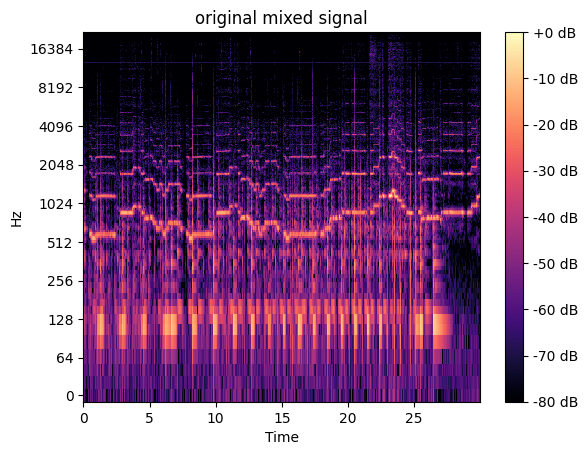

In [26]:
display_spectogram(mix_wav,'original mixed signal')

In [27]:
from IPython.display import Audio
Audio(mix_wav, rate=44100)

/tmp/ipykernel_26/2556823451.py:3: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  S = librosa.amplitude_to_db(D, ref=np.max)


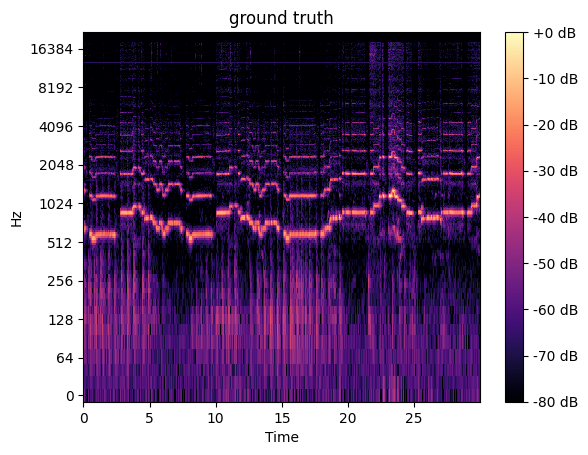

In [28]:
from IPython.display import Audio
mix_wav, _ = librosa.load('/kaggle/input/to-delete-renamed/Bansuri/21.wav', sr=44100)
display_spectogram(mix_wav,'ground truth')

In [29]:
Audio(mix_wav, rate=44100)

/tmp/ipykernel_26/2556823451.py:3: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  S = librosa.amplitude_to_db(D, ref=np.max)


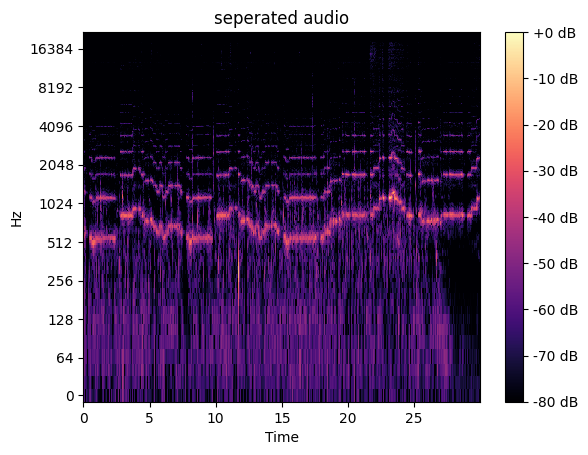

In [30]:
display_spectogram(y,'seperated audio')

In [31]:
Audio(y, rate=44100)

In [32]:
# sf.write('/content/drive/MyDrive/modelv_5/predict/target.wav', y , 44000)